Make sure you fill your name and NetID below:

In [1]:
NAME = "Vikram Sahai Saxena"
NET_ID = "vs799"

---

# Introduction

This assignment will cover the basics of OpenCV.  OpenCV is widely used in computer vision, so it is important to become familiar with it.

This notebook will walk you through many of the important features of OpenCV that you will need to use throughout the semester. In some cells you will see code blocks that look like this:

```python
###############################################################################
# TODO: Create a variable x with value 3.7
###############################################################################
pass
# END OF YOUR CODE
```

You should replace the `pass` statement with your own code and leave the blocks intact, like this:
```python
###############################################################################
# TODO: Create a variable x with value 3.7
###############################################################################
x = 3.7
# END OF YOUR CODE
```


When completing the notebook, please adhere to the following rules:
- Do not write or modify any code outside of code blocks
- Do not add or delete any cells from the notebook. You may add new cells to perform scatch work, but delete them before submitting.
- Run all cells before submitting. You will only get credit for code that has been run.


# Install and Import OpenCV

[OpenCV](http://opencv.org) is an open source library that includes several hundreds of computer vision algorithms.  We will use OpenCV-Python in this notebook, which is a Python wrapper for the original OpenCV C++ implementation.

<!-- OpenCV supports a wide variety of programming languages such as C++, Python, Java, etc., -->
<!-- At its core, PyTorch provides a few key features:

- A multidimensional **Tensor** object, similar to [numpy](https://numpy.org/) but with GPU accelleration.
- An optimized **autograd** engine for automatically computing derivatives
- A clean, modular API for building and deploying **deep learning models** -->

<!-- We will use PyTorch for all programming assignments throughout the semester. This notebook will focus on the **Tensor API**. -->

You can find more information about OpenCV by following the [official OpenCV-Python tutorials](https://docs.opencv.org/4.x/d6/d00/tutorial_py_root.html) or by reading the [documentation](https://docs.opencv.org/4.x/)

In this notebook we will cover:

* Reading & Writing images with OpenCV
* Basic Image Manipulations
* Basic Point Operations
* Image Thresholding
* Morphological Transformations
* Image Smoothing
* Image Histogram

To use OpenCV, we first need to install and import the `cv2` package.

We also check the version; the assignments in this course will use OpenCV verion above 4.6.0.

In [2]:
# install OpenCV
!pip install opencv-python

In [3]:
import cv2
print(cv2.__version__)

4.8.0


In [4]:
# import other packages for this tutorial
import random
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from IPython.display import Image


# <font style="color:black">Read & save images using OpenCV</font>

OpenCV allows reading different types of images (JPG, PNG, etc). You can load grayscale images, color images or you can also load images with Alpha channel. It uses the **`cv2.imread()`** function which has the following syntax:

 <font color="green">**Function Syntax** </font>
``` python
retval = cv2.imread( filename[, flags] )
```

`retval`: Is the image if it is successfully loaded. Otherwise it is `None`. This may happen if the filename is wrong or the file is corrupt.

The function has **1 required input argument** and one optional flag:


1. `filename`: This can be an **absolute** or **relative** path. This is a **mandatory argument**.
2. `Flags`:    These flags are used to read an image in a particular format (for example, grayscale/color/with alpha channel). This is an **optional argument** with a default value of `cv2.IMREAD_COLOR` or `1` which loads the image as a color image.

Before we proceed with some examples, let's also have a look at some of the `flags` available.

**Flags**
1. **`cv2.IMREAD_GRAYSCALE`** or **`0`**: Loads image in grayscale mode
2. **`cv2.IMREAD_COLOR`** or **`1`**: Loads a color image. Any transparency of image will be neglected. It is the default flag.
3. **`cv2.IMREAD_UNCHANGED`** or **`-1`**: Loads image as such including alpha channel.

## Read and display gray scale image

In [7]:
# Read image as gray scale.
cb_img = cv2.imread("img/checkerboard_18x18.png",0)

# Print the image data (pixel values), element of a 2D numpy array.
# Each pixel value is 8-bits [0,255]
print(cb_img)

[[  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0

Image size is  (18, 18)
Data type of image is  uint8


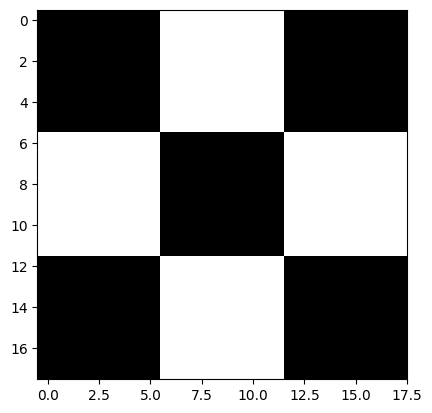

In [8]:
# print the size  of image
print("Image size is ", cb_img.shape)

# print data-type of image
print("Data type of image is ", cb_img.dtype)

# Display image.
plt.imshow(cb_img, cmap='gray')

Accessing individual pixels

In [9]:
# print the first pixel of the first black box
print(cb_img[0,0])
# print the first white pixel to the right of the first black box
print(cb_img[0,6])

0
255


Modifying image pixels

[[  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0 200 200   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0 200 200   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0

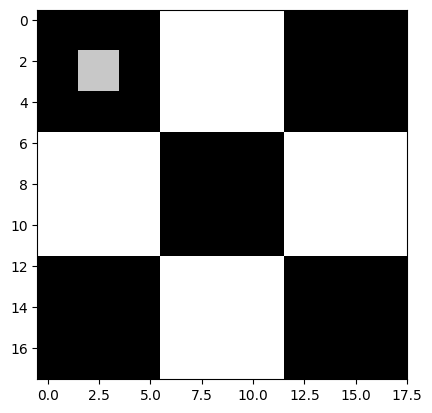

In [10]:
cb_img_copy = cb_img.copy()
cb_img_copy[2,2] = 200
cb_img_copy[2,3] = 200
cb_img_copy[3,2] = 200
cb_img_copy[3,3] = 200

# Same as above
# cb_img_copy[2:3,2:3] = 200

plt.imshow(cb_img_copy, cmap='gray')
print(cb_img_copy)

Now it's your turn:

1. load the image `water_coins.jpg` in `img` folder in gray scale mode to the variable `water_coins`
2. modify the pixels in `water_coins` with values greater than 190 to 255, and with values less than or equal to 190 to 0

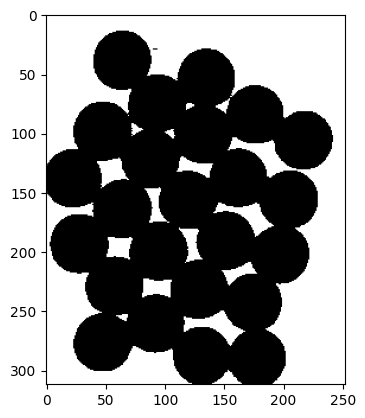

In [11]:
water_coins = None
##############################################################################
# TODO: 1. read water_coins.jpg, 2. modify pixels to 0 or 255                #
##############################################################################
# Replace "pass" statement with your code
water_coins = cv2.imread("img/water_coins.jpg",0)
water_coins[water_coins > 190] = 255
water_coins[water_coins <= 190] = 0
# END OF YOUR CODE

plt.imshow(water_coins, cmap='gray')

In [12]:
assert np.unique(water_coins).shape==(2,)
assert np.unique(water_coins)[1]==255

## Read and display color image

Until now, we have been using gray scale images in our discussion. Let us now discuss color images.

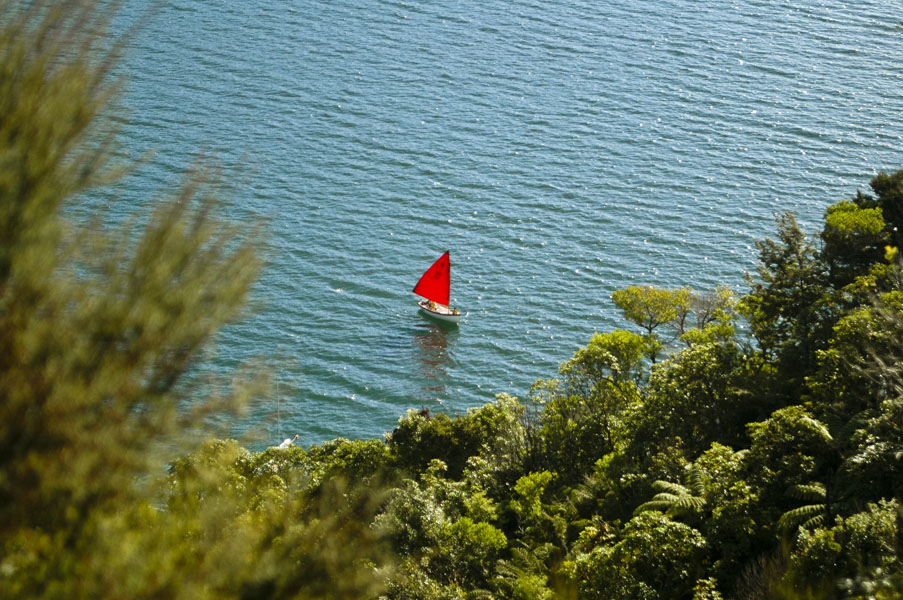

In [13]:
# display the image using IPython image function
Image(filename='img/New_Zealand_Boat.jpg')

Let us read the image with opencv and check the parameters. Note the image dimension.

In [14]:
# Read in image using opencv
boat_img = cv2.imread("img/New_Zealand_Boat.jpg",1)

# print the size  of image
print("Image size is ", boat_img.shape)

# print data-type of image
print("Data type of image is ", boat_img.dtype)

print("")

Image size is  (600, 903, 3)
Data type of image is  uint8



## Splitting and Merging Color Channels


**`cv2.split()`** Divides a multi-channel array into several single-channel arrays.

**`cv2.merge()`** Merges several arrays to make a single multi-channel array. All the input matrices must have the same size.

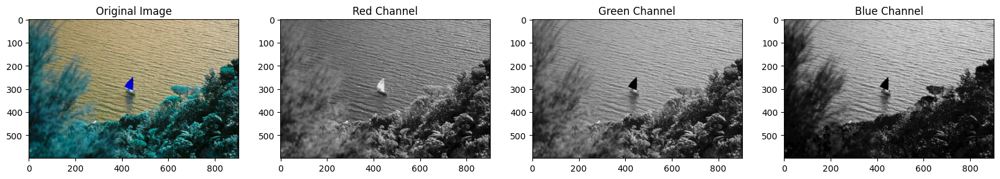

In [15]:
# Split the image into the B,G,R components
b,g,r = cv2.split(boat_img)

# Show the channels
plt.figure(figsize=[20,5])

plt.subplot(141);plt.imshow(boat_img);plt.title("Original Image");
plt.subplot(142);plt.imshow(r,cmap='gray');plt.title("Red Channel");
plt.subplot(143);plt.imshow(g,cmap='gray');plt.title("Green Channel");
plt.subplot(144);plt.imshow(b,cmap='gray');plt.title("Blue Channel");

The color of original image displayed above is different from the actual image. This is because matplotlib expects the image in **RGB** format whereas OpenCV stores color images in **BGR** format. Thus, for correct display, we need to reverse the channels of the image.

Your turn: use [`cv2.merge`](https://docs.opencv.org/4.7.0/d2/de8/group__core__array.html#ga7d7b4d6c6ee504b30a20b1680029c7b4) to correct the display

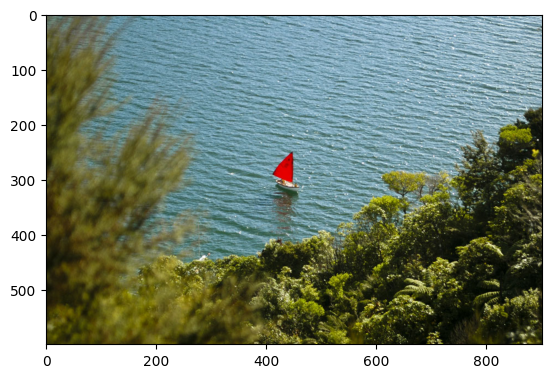

In [16]:
boat_img_channels_RGB = None
##############################################################################
# TODO: use cv2.merge to reorder channels to correct the display             #
##############################################################################
# Replace "pass" statement with your code
boat_img_channels_RGB = cv2.merge([r, g, b])
# END OF YOUR CODE

plt.imshow(boat_img_channels_RGB)

In [17]:
assert boat_img_channels_RGB[0,0,0]==r[0,0]
assert boat_img_channels_RGB[0,0,1]==g[0,0]
assert boat_img_channels_RGB[0,0,2]==b[0,0]

## Saving Images

Saving the image is as trivial as reading an image in OpenCV. We use the function **`cv2.imwrite()`** with two arguments. The first one is the filename, second argument is the image object.

The function imwrite saves the image to the specified file. The image format is chosen based on the filename extension (see cv::imread for the list of extensions). In general, only 8-bit single-channel or 3-channel (with 'BGR' channel order) images can be saved using this function (see the OpenCV documentation for further details).


 <font style="color:rgb(8,133,37)">**Function Syntax** </font>
``` python
cv2.imwrite( filename, img[, params] )
```

The function has **2 required arguments**:

1. `filename`: This can be an **absolute** or **relative** path.
2. `img`: Image or Images to be saved.

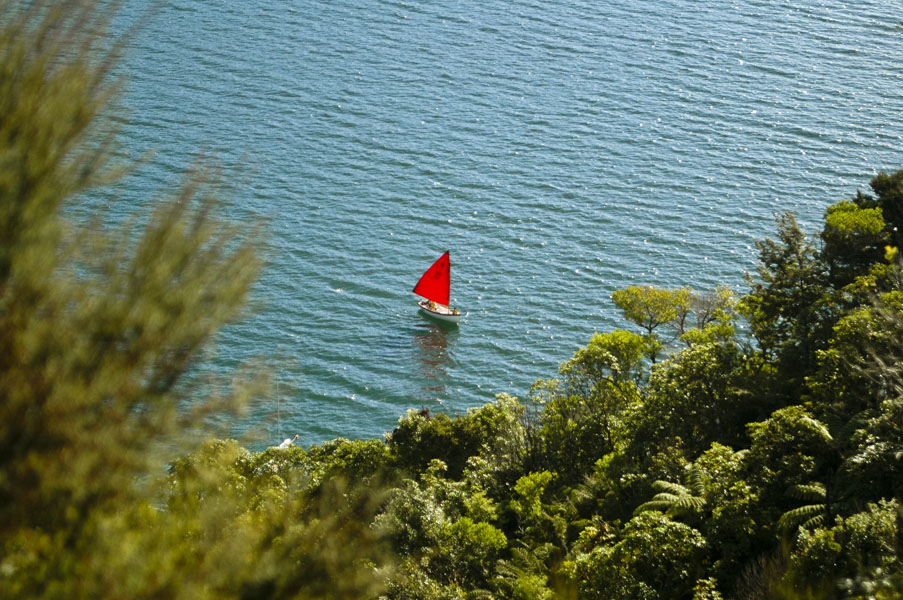

In [18]:
cv2.imwrite("img/boat_saved.png", boat_img)
# show the image from saved file
Image(filename='img/boat_saved.png')

# Basic Image Manipulations

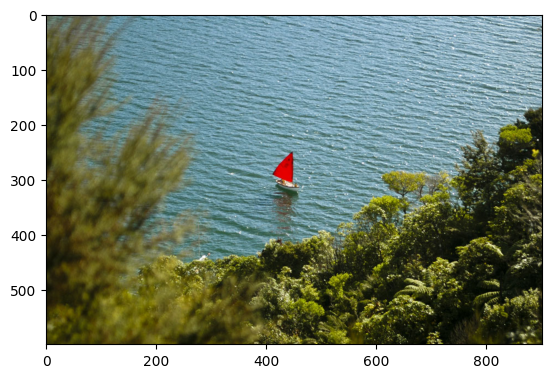

In [19]:
boat_img = cv2.imread("img/New_Zealand_Boat.jpg")
boat_img_rgb = boat_img[:,:,::-1]
plt.imshow(boat_img_rgb)

## Cropping images

Cropping an image is simply achieved by selecting a specific (pixel) region of the image.

(200, 300, 3)


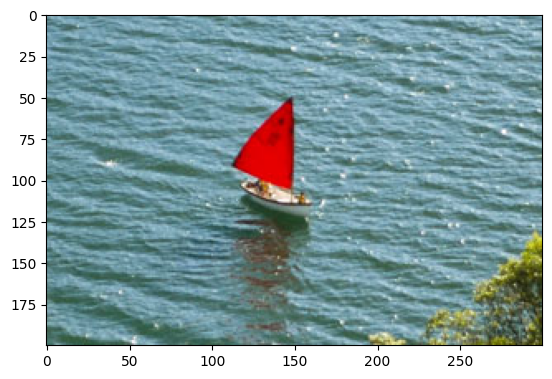

In [20]:
boat_img_rgb_cropped = boat_img_rgb[200:400, 300:600]
print(boat_img_rgb_cropped.shape)
plt.imshow(boat_img_rgb_cropped)

## Resizing Images

The function **`resize`** resizes the image `src` down to or up to the specified size. The size and type are derived from the `src`,`dsize`,`fx`, and `fy`.

 <font style="color:rgb(8,133,37)">**Function Syntax** </font>
``` python
dst = cv2.resize( src, dsize[, dst[, fx[, fy[, interpolation]]]] )
```

`dst`: output image; it has the size dsize (when it is non-zero) or the size computed from src.size(), fx, and fy; the type of dst is the same as of src.

The function has **2 required arguments**:
    
1. `src`:	input image
2. `dsize`: output image size

Optional arguments that are often used include:

1. `fx`: Scale factor along the horizontal axis; when it equals 0, it is computed as (𝚍𝚘𝚞𝚋𝚕𝚎)𝚍𝚜𝚒𝚣𝚎.𝚠𝚒𝚍𝚝𝚑/𝚜𝚛𝚌.𝚌𝚘𝚕𝚜
2. `fy`: Scale factor along the vertical axis; when it equals 0, it is computed as (𝚍𝚘𝚞𝚋𝚕𝚎)𝚍𝚜𝚒𝚣𝚎.𝚑𝚎𝚒𝚐𝚑𝚝/𝚜𝚛𝚌.𝚛𝚘𝚠𝚜

The output image has the size `dsize` (when it is non-zero) or the size computed from `src.size()`, `fx`, and `fy`; the type of dst is the same as of src.

#### Method 1: Specifying exact size of the output image

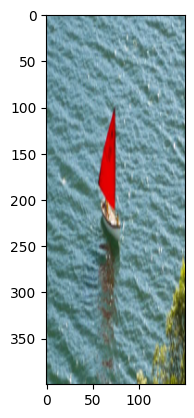

In [21]:
desired_width = 150 # scale 0.5
desired_height = 400 # scale 2
dim = (desired_width, desired_height)

# Resize the image to exact size
resized_cropped_region = cv2.resize(boat_img_rgb_cropped, dsize=dim, interpolation  = cv2.INTER_LINEAR)
plt.imshow(resized_cropped_region)

#### Method 2: Specifying Scaling Factor using fx and fy

Your turn: use scaling factor in [`cv2.resize`](https://docs.opencv.org/4.7.0/da/d54/group__imgproc__transform.html#ga47a974309e9102f5f08231edc7e7529d) to get the same resized image as in method 1

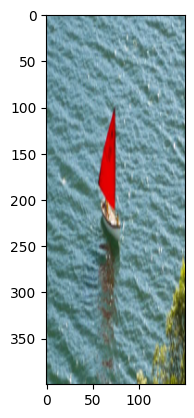

In [22]:
resized_cropped_region_2 = None
##############################################################################
# TODO: use scaling factor in cv2.resize to get the same resized image as in #
# method 1, use cv2.INTER_LINEAR as interpolation method                     #
##############################################################################
# Replace "pass" statement with your code
resized_cropped_region_2 = cv2.resize(boat_img_rgb_cropped, None, fx = 0.5, fy = 2, interpolation  = cv2.INTER_LINEAR)
# END OF YOUR CODE

plt.imshow(resized_cropped_region_2)

In [23]:
assert resized_cropped_region_2.shape == resized_cropped_region.shape

## Flipping Images


The function **`flip`** flips the array in one of three different ways (row and column indices are 0-based):

 <font style="color:rgb(8,133,37)">**Function Syntax** </font>
``` python
dst = cv2.flip( src, flipCode )
```

`dst`: output array of the same size and type as src.

The function has **2 required arguments**:
    
1. `src`:	input image
2. `flipCode`: a flag to specify how to flip the array; 0 means flipping around the x-axis and positive value (for example, 1) means flipping around y-axis. Negative value (for example, -1) means flipping around both axes.


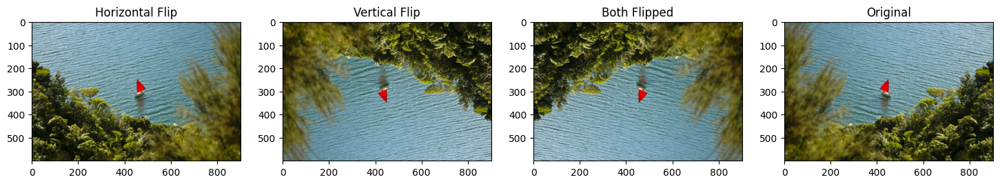

In [24]:
boat_img_rgb_flipped_horz = cv2.flip(boat_img_rgb, 1)
boat_img_rgb_flipped_vert = cv2.flip(boat_img_rgb, 0)
boat_img_rgb_flipped_both = cv2.flip(boat_img_rgb, -1)

# Show the images
plt.figure(figsize=[18,5])
plt.subplot(141);plt.imshow(boat_img_rgb_flipped_horz);plt.title("Horizontal Flip");
plt.subplot(142);plt.imshow(boat_img_rgb_flipped_vert);plt.title("Vertical Flip");
plt.subplot(143);plt.imshow(boat_img_rgb_flipped_both);plt.title("Both Flipped");
plt.subplot(144);plt.imshow(boat_img_rgb);plt.title("Original");

## Rotating Images

The function **`rotate`** rotates the array in multiples of 90 degrees:

 <font style="color:rgb(8,133,37)">**Function Syntax** </font>
``` python
dst = cv2.rotate( src, rotateCode )
```

`dst`: output array of the same type as src.

The function has **2 required arguments**:
    
1. `src`:	input image
2. `rotateCode`: a flag to specify how to rotate the array; Rotate by 90 degrees clockwise (rotateCode = 0). Rotate by 180 degrees clockwise (rotateCode = 1). Rotate by 270 degrees clockwise (rotateCode = 2).

Your turn: complete the code below using [`cv2.rotate`](https://docs.opencv.org/4.7.0/d2/de8/group__core__array.html#ga4ad01c0978b0ce64baa246811deeac24) to rotate the image `boat_img_rgb` by 90 degree, 180 degree and 270 degree clockwise

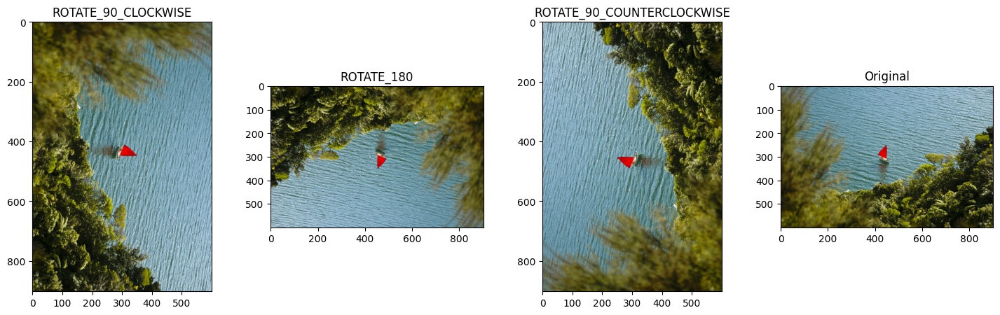

In [25]:
boat_img_rgb_rotate_90 = None
boat_img_rgb_rotate_180 = None
boat_img_rgb_rotate_270 = None
##############################################################################
# TODO: complete the code below using cv2.rotate to rotate the image         #
# boat_img_rgb by 90 degree, 180 degree and 270 degree clockwise             #
##############################################################################
# Replace "pass" statement with your code
boat_img_rgb_rotate_90 = cv2.rotate( boat_img_rgb, 0)
boat_img_rgb_rotate_180 = cv2.rotate( boat_img_rgb, 1)
boat_img_rgb_rotate_270 = cv2.rotate( boat_img_rgb, 2)
# END OF YOUR CODE

# Show the images
plt.figure(figsize=[18,5])
plt.subplot(141);plt.imshow(boat_img_rgb_rotate_90);plt.title("ROTATE_90_CLOCKWISE");
plt.subplot(142);plt.imshow(boat_img_rgb_rotate_180);plt.title("ROTATE_180");
plt.subplot(143);plt.imshow(boat_img_rgb_rotate_270);plt.title("ROTATE_90_COUNTERCLOCKWISE");
plt.subplot(144);plt.imshow(boat_img_rgb);plt.title("Original");

In [26]:
assert boat_img_rgb_rotate_90.shape == boat_img_rgb.transpose(1,0,2).shape
assert boat_img_rgb_rotate_180.shape == boat_img_rgb.shape
assert boat_img_rgb_rotate_270.shape == boat_img_rgb.transpose(1,0,2).shape

# Basic Point Operations
This section includes increasing and decreasing pixel values, adjusting contrast, clamping and bitwise operations.

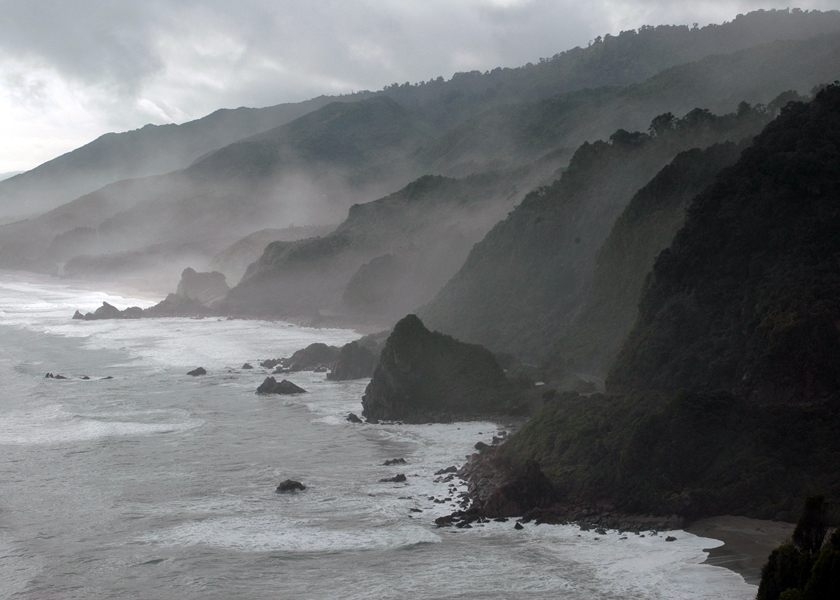

In [27]:
# show the original image
img_bgr = cv2.imread("img/New_Zealand_Coast.jpg",cv2.IMREAD_COLOR)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

# Display 18x18 pixel image.
Image(filename='img/New_Zealand_Coast.jpg')

## Addition or Brightness
The first operation we discuss is simple addition of images. This results in increasing or decreasing the brightness of the image since we are eventually increasing or decreasing the intensity values of each pixel by the same amount. So, this will result in a global increase/decrease in brightness.

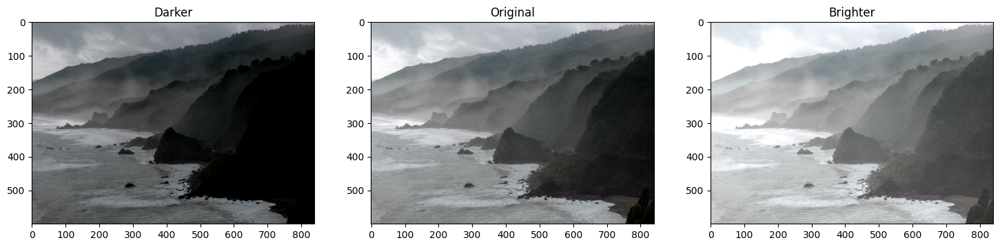

In [28]:
matrix = np.ones(img_rgb.shape, dtype = "uint8") * 50

img_rgb_brighter = cv2.add(img_rgb, matrix)
img_rgb_darker   = cv2.subtract(img_rgb, matrix)

# Show the images
plt.figure(figsize=[18,5])
plt.subplot(131); plt.imshow(img_rgb_darker);  plt.title("Darker");
plt.subplot(132); plt.imshow(img_rgb);         plt.title("Original");
plt.subplot(133); plt.imshow(img_rgb_brighter);plt.title("Brighter");

## Multiplication or Contrast
Just like addition can result in brightness change, multiplication can be used to improve the contrast of the image.

Contrast is the difference in the intensity values of the pixels of an image. Multiplying the intensity values with a constant can make the difference larger or smaller ( if multiplying factor is < 1 ).

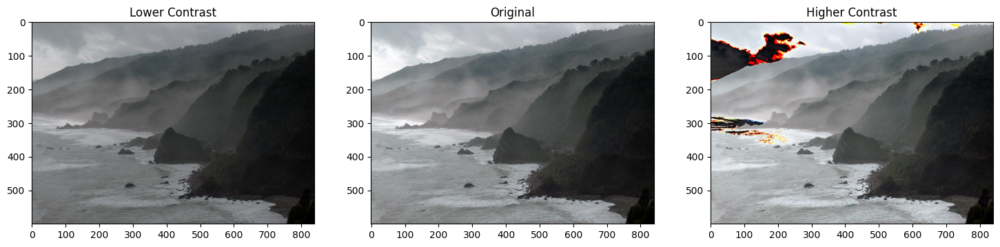

In [29]:
matrix1 = np.ones(img_rgb.shape) * .8
matrix2 = np.ones(img_rgb.shape) * 1.2

img_rgb_darker   = np.uint8(cv2.multiply(np.float64(img_rgb), matrix1))
img_rgb_brighter = np.uint8(cv2.multiply(np.float64(img_rgb), matrix2))

# Show the images
plt.figure(figsize=[18,5])
plt.subplot(131); plt.imshow(img_rgb_darker);  plt.title("Lower Contrast");
plt.subplot(132); plt.imshow(img_rgb);         plt.title("Original");
plt.subplot(133); plt.imshow(img_rgb_brighter);plt.title("Higher Contrast");

## Clamping

Can you see the weird colors in some areas of the image above after multiplication?

The issue is that after multiplying, the values which are already high, are becoming greater than 255. Thus, the overflow issue. How do we overcome this?

<font color="green"> You turn:</font> Handling Overflow in `img_rgb_brighter_overflow` using `np.clip`

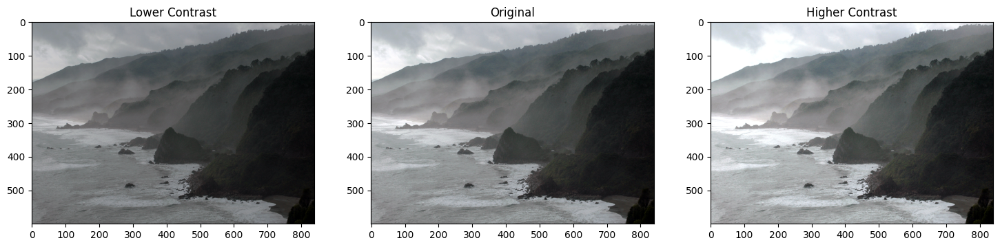

In [30]:
img_rgb_brighter_overflow  = cv2.multiply(np.float64(img_rgb), matrix2)
img_rgb_brighter_clipped = None
##############################################################################
# TODO: clip the values of img_rgb_brighter_overflow between [0,255].        #
##############################################################################
# Replace "pass" statement with your code
img_rgb_brighter_clipped = np.uint8(np.clip(img_rgb_brighter_overflow, 0, 255))
# END OF YOUR CODE


# Show the images
plt.figure(figsize=[18,5])
plt.subplot(131); plt.imshow(img_rgb_darker);  plt.title("Lower Contrast");
plt.subplot(132); plt.imshow(img_rgb);         plt.title("Original");
plt.subplot(133); plt.imshow(img_rgb_brighter_clipped);plt.title("Higher Contrast");

In [31]:
assert img_rgb_brighter_clipped.max() == 255

## Bitwise Operations

 <font style="color:rgb(8,133,37)">**Function Syntax**</font>

Example API for `cv2.bitwise_and()`. Others include: `cv2.bitwise_or()`, `cv2.bitwise_xor()`, `cv2.bitwise_not()`

``` python
dst = cv2.bitwise_and( src1, src2[, dst[, mask]] )
```

`dst`: Output array that has the same size and type as the input arrays.

The function has **2 required arguments**:

1. `src1`:	first input array or a scalar.
2. `src2`:	second input array or a scalar.

An important optional argument is:

1. `mask`:	optional operation mask, 8-bit single channel array, that specifies elements of the output array to be changed.

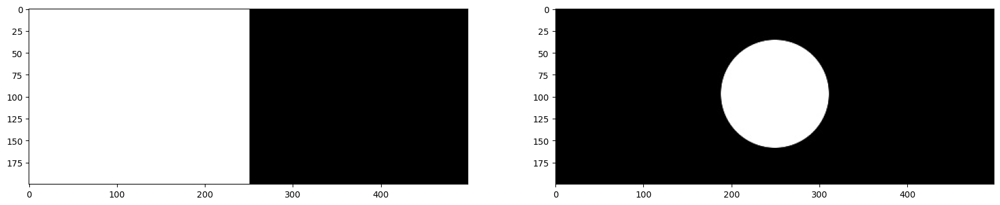

In [32]:
img_rec = cv2.imread("img/rectangle.jpg", cv2.IMREAD_GRAYSCALE)
img_cir = cv2.imread("img/circle.jpg", cv2.IMREAD_GRAYSCALE)

plt.figure(figsize=[20,5])
plt.subplot(121);plt.imshow(img_rec,cmap='gray')
plt.subplot(122);plt.imshow(img_cir,cmap='gray')
plt.show()

Bitwise AND Operator

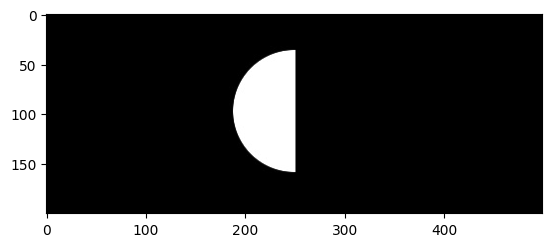

In [33]:
result_and = cv2.bitwise_and(img_rec, img_cir, mask = None)
plt.imshow(result_and,cmap='gray')

Your turn: calculate Bitwise OR and Bitwise XOR between `img_rec` and `img_cir`

(<Axes: >, <matplotlib.image.AxesImage at 0x7fa038aa8c10>)

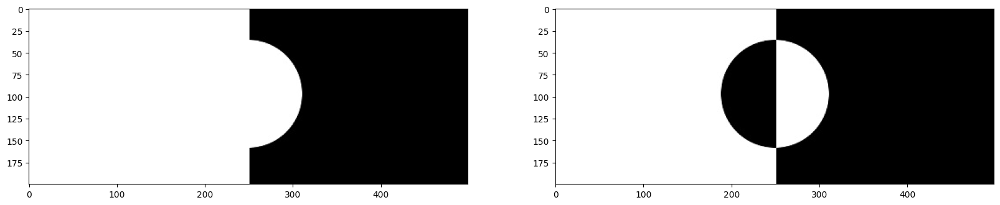

In [34]:
result_or = None
result_xor = None
##############################################################################
# TODO: calculate Bitwise OR and Bitwise XOR between img_rec and img_cir     #
##############################################################################
# Replace "pass" statement with your code
result_or = cv2.bitwise_or(img_rec, img_cir, mask = None)
result_xor = cv2.bitwise_xor(img_rec, img_cir, mask = None)
# END OF YOUR CODE

plt.figure(figsize=[20,5])
plt.subplot(121),plt.imshow(result_or,cmap='gray')
plt.subplot(122),plt.imshow(result_xor,cmap='gray')

In [35]:
assert result_or.max() == 255
assert result_xor.max() == 255

# Image Thresholding
Binary Images have a lot of use cases in Image Processing. One of the most common use cases is that of creating masks. Image Masks allow us to process on specific parts of an image keeping the other parts intact. Image Thresholding is used to create Binary Images from grayscale images. You can use different thresholds to create different binary images from the same original image.

 <font style="color:rgb(8,133,37)">**Function Syntax** </font>

``` python
retval, dst = cv2.threshold( src, thresh, maxval, type[, dst] )
```

`dst`: The output array of the same size and type and the same number of channels as `src`.

The function has **4 required arguments**:

1. `src`: input array (multiple-channel, 8-bit or 32-bit floating point).
2. `thresh`: threshold value.
3. `maxval`: maximum value to use with the THRESH_BINARY and THRESH_BINARY_INV thresholding types.
4. `type`: thresholding type (see ThresholdTypes).


 <font style="color:rgb(8,133,37)">**Function Syntax** </font>

``` python
dst = cv.adaptiveThreshold( src, maxValue, adaptiveMethod, thresholdType, blockSize, C[, dst] )
```

`dst`	Destination image of the same size and the same type as src.

The function has **6 required arguments**:
1. `src`:	Source 8-bit single-channel image.

2. `maxValue`:	Non-zero value assigned to the pixels for which the condition is satisfied
3. `adaptiveMethod`:	Adaptive thresholding algorithm to use, see AdaptiveThresholdTypes. The BORDER_REPLICATE | BORDER_ISOLATED is used to process boundaries.
4. `thresholdType:`	Thresholding type that must be either THRESH_BINARY or THRESH_BINARY_INV, see ThresholdTypes.
5. `blockSize`:	Size of a pixel neighborhood that is used to calculate a threshold value for the pixel: 3, 5, 7, and so on.
6. `C`:	Constant subtracted from the mean or weighted mean (see the details below). Normally, it is positive but may be zero or negative as well.

Suppose you wanted to build an application that could read (decode) sheet music. This is similar to
Optical Character Recognigition (OCR) for text documents where the goal is to recognize text characters. In either application, one of the first steps in the processing pipeline is to isolate the important information in the image of a document (separating it from the background). This task can be accomplished with thresholding
techniques. Let's take a look at an example.

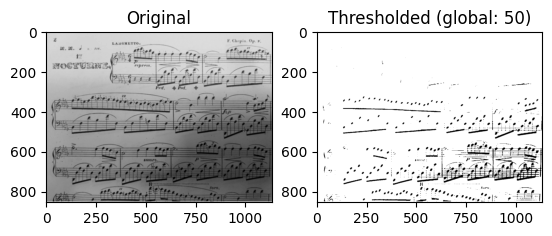

In [36]:
# Read the original image
img_read = cv2.imread("img/Piano_Sheet_Music.png", cv2.IMREAD_GRAYSCALE)
# Perform global thresholding
retval, img_thresh_gbl_1 = cv2.threshold(img_read, thresh=50, maxval=255, type=cv2.THRESH_BINARY)
# Show the images
plt.subplot(121); plt.imshow(img_read,        cmap="gray");  plt.title("Original");
plt.subplot(122); plt.imshow(img_thresh_gbl_1,cmap="gray");  plt.title("Thresholded (global: 50)");

Your turn: follow the example above, try `thresh=130` using [`cv2.threshold`](https://docs.opencv.org/4.7.0/d7/d1b/group__imgproc__misc.html#gae8a4a146d1ca78c626a53577199e9c57)

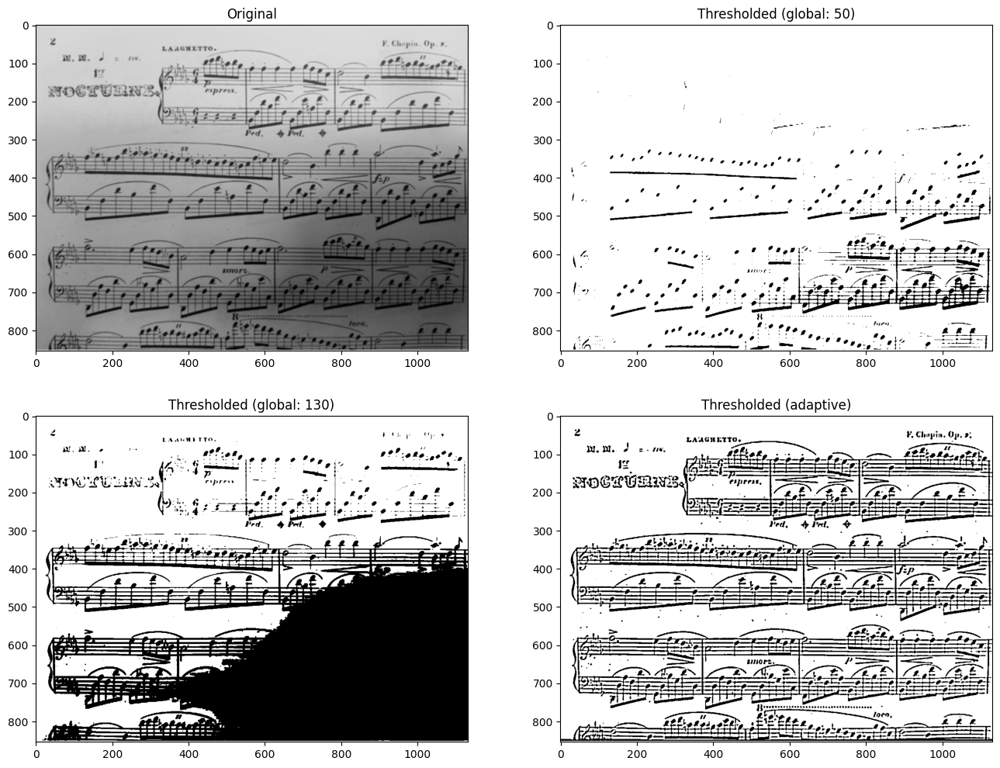

In [37]:
img_thresh_gbl_2 = None
##############################################################################
# TODO: follow the example above, try thresh=130 using cv2.threshold         #
# (only change thresh compared to the example above)                         #
##############################################################################
# Replace "pass" statement with your code
retval, img_thresh_gbl_2 = cv2.threshold(img_read, thresh=130, maxval=255, type=cv2.THRESH_BINARY)
# END OF YOUR CODE

# Perform adaptive thresholding
img_thresh_adp = cv2.adaptiveThreshold(img_read, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 7)

# Show the images
plt.figure(figsize=[16,12])
plt.subplot(221); plt.imshow(img_read,        cmap="gray");  plt.title("Original");
plt.subplot(222); plt.imshow(img_thresh_gbl_1,cmap="gray");  plt.title("Thresholded (global: 50)");
plt.subplot(223); plt.imshow(img_thresh_gbl_2,cmap="gray");  plt.title("Thresholded (global: 130)");
plt.subplot(224); plt.imshow(img_thresh_adp,  cmap="gray");  plt.title("Thresholded (adaptive)");

In [38]:
assert np.unique(img_thresh_gbl_2).shape==(2,)
assert np.unique(img_thresh_gbl_2)[1]==255

# Morphological Transformations
Morphological transformations are some simple operations based on the image shape. It is normally performed on binary images. It needs two inputs, one is our original image, second one is called structuring element or kernel which decides the nature of operation. Two basic morphological operators are Erosion and Dilation. Then its variant forms like Opening, Closing etc also comes into play.

- `Erosion`: it erodes away the boundaries of foreground object (Always try to keep foreground in white)
- `Dilation`: opposite of erosion, it increases the white region in the image or size of foreground object increases.
- `opening`: Opening is just another name of erosion followed by dilation. It is useful in removing noise
- `closing`: Closing is reverse of Opening, Dilation followed by Erosion. It is useful in closing small holes inside the foreground objects, or small black points on the object.

Let us try the following examples using the four operations:

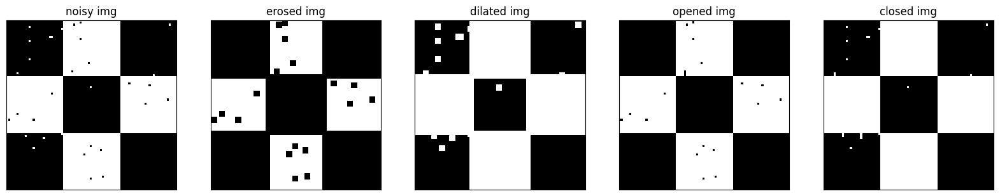

In [39]:
cb_img_noisy = cv2.imread("img/checkerboard_84x84_noisy.png",0)

kernel = np.ones((3,3),np.uint8)
# erosion
cb_img_erosion = cv2.erode(cb_img_noisy,kernel,iterations = 1)
# dilation
cb_img_dilation = cv2.dilate(cb_img_noisy,kernel,iterations = 1)
# opening
cb_img_opening = cv2.morphologyEx(cb_img_noisy, cv2.MORPH_OPEN, kernel)
# closing
cb_img_closing = cv2.morphologyEx(cb_img_noisy, cv2.MORPH_CLOSE, kernel)

# show image
plt.figure(figsize=[20,5])
plt.subplot(151),plt.imshow(cb_img_noisy,cmap="gray"),plt.title('noisy img')
plt.xticks([]), plt.yticks([])
plt.subplot(152),plt.imshow(cb_img_erosion,cmap="gray"),plt.title('erosed img')
plt.xticks([]), plt.yticks([])
plt.subplot(153),plt.imshow(cb_img_dilation,cmap="gray"),plt.title('dilated img')
plt.xticks([]), plt.yticks([])
plt.subplot(154),plt.imshow(cb_img_opening,cmap="gray"),plt.title('opened img')
plt.xticks([]), plt.yticks([])
plt.subplot(155),plt.imshow(cb_img_closing,cmap="gray"),plt.title('closed img')
plt.xticks([]), plt.yticks([])
plt.show()

Your turn: we can denoise the noisy image above by first opening and then closing the image, complete the following function using [`cv2.morphologyEx`](https://docs.opencv.org/4.7.0/d4/d86/group__imgproc__filter.html#ga67493776e3ad1a3df63883829375201f)

In [40]:
def denoise(img):
    kernel = np.ones((3,3),np.uint8)
    denoise_img = np.zeros_like(img)
    ##############################################################################
    # TODO: 1. apply opening on img; 2. apply closing on the img after step1     #
    ##############################################################################
    # Replace "pass" statement with your code
    open_img = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)
    denoise_img = cv2.morphologyEx(open_img, cv2.MORPH_CLOSE, kernel)
    # END OF YOUR CODE
    return denoise_img

In [41]:
cb_img_denoised = denoise(cb_img_noisy)
assert np.unique(cb_img_denoised)[0]==0
assert np.unique(cb_img_denoised)[1]==255

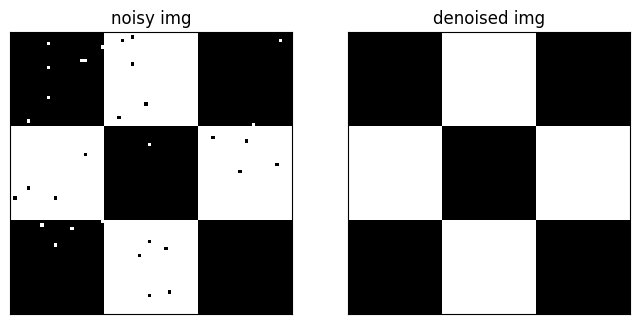

In [42]:
plt.figure(figsize=[8,5])
plt.subplot(121),plt.imshow(cb_img_noisy,cmap="gray"),plt.title('noisy img')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(cb_img_denoised,cmap="gray"),plt.title('denoised img')
plt.xticks([]), plt.yticks([])
plt.show()

# Image Smoothing
Image blurring is achieved by convolving the image with a low-pass filter kernel. It is useful for removing noise. It actually removes high frequency content (eg: noise, edges) from the image. So edges are blurred a little bit in this operation (there are also blurring techniques which don't blur the edges). OpenCV provides four main types of blurring techniques: `Averaging`, `Gaussian Blurring`, `Median Blurring` and `Bilateral Filtering`.

### Averaging

This is done by convolving an image with a normalized box filter. It simply takes the average of all the pixels under the kernel area and replaces the central element. This is done by the function [`cv2.blur()`](https://docs.opencv.org/4.7.0/d4/d86/group__imgproc__filter.html#ga8c45db9afe636703801b0b2e440fce37) or `cv2.boxFilter()`. Check the docs for more details about the kernel. We should specify the width and height of the kernel. A 3x3 normalized box filter would look like the below:

$$ K=\frac{1}{9}
\begin{bmatrix}
1&1&1 \\
1&1&1 \\
1&1&1
\end{bmatrix}
$$



<!-- ## Image Smoothing
OpenCV provides a function cv.filter2D() to convolve a kernel with an image. A 3x3 averaging filter kernel will look like the below:

$$ K=\frac{1}{9}
\begin{bmatrix}
1&1&1 \\
1&1&1 \\
1&1&1
\end{bmatrix}
$$

### <font color="green">Function Syntax </font>

``` python
dst = cv.filter2D(src, ddepth, kernel[, dst[, anchor[, delta[, borderType]]]])
```

`dst`: output image of the same size and the same number of channels as `src`.

The function has **4 required arguments**:

1. `src`	input image.
2. `ddepth`	desired depth of the destination image, see combinations
3. `kernel`	convolution kernel (or rather a correlation kernel), a single-channel floating point matrix; if you want to apply different kernels to different channels, split the image into separate color planes using split and process them individually.
4. `anchor`	anchor of the kernel that indicates the relative position of a filtered point within the kernel; the anchor should lie within the kernel; default value (-1,-1) means that the anchor is at the kernel center.
5. `delta`	optional value added to the filtered pixels before storing them in dst.
6. `borderType`	pixel extrapolation method, see BorderTypes. BORDER_WRAP is not supported.


### <font color="green">Function Syntax </font>

``` python
dst = cv.adaptiveThreshold( src, maxValue, adaptiveMethod, thresholdType, blockSize, C[, dst] )
```

`dst`	Destination image of the same size and the same type as src.

The function has **6 required arguments**:
1. `src`:	Source 8-bit single-channel image.

2. `maxValue`:	Non-zero value assigned to the pixels for which the condition is satisfied
3. `adaptiveMethod`:	Adaptive thresholding algorithm to use, see AdaptiveThresholdTypes. The BORDER_REPLICATE | BORDER_ISOLATED is used to process boundaries.
4. `thresholdType:`	Thresholding type that must be either THRESH_BINARY or THRESH_BINARY_INV, see ThresholdTypes.
5. `blockSize`:	Size of a pixel neighborhood that is used to calculate a threshold value for the pixel: 3, 5, 7, and so on.
6. `C`:	Constant subtracted from the mean or weighted mean (see the details below). Normally, it is positive but may be zero or negative as well.

### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>

https://docs.opencv.org/4.5.1/d7/d1b/group__imgproc__misc.html#gae8a4a146d1ca78c626a53577199e9c57

https://docs.opencv.org/4.5.1/d7/d4d/tutorial_py_thresholding.html -->

Your turn: complete the `average_blur` function below. Do _not_ use the built-in function in OpenCV  

In [43]:
# We will use this helper function to check your results
def max_diff(actual,expected):
    max_diff = np.abs(actual.astype(np.float32) - expected.astype(np.float32)).max()
    return max_diff

In [44]:
def average_blur(image,kernel_size):
    """
    Blurs an color image using the normalized square box filter.

    Inputs:
    - image: input color image
    - kernel_size: size of normalized square box filter

    Returns:
    - output: output blurred image of the same size and type as input image
    """
    assert len(image.shape)==3
    assert type(kernel_size) == int
    kernel = np.ones((kernel_size,kernel_size),np.float32)/kernel_size**2
    k1,k2 = kernel.shape
    h,w,_ = image.shape
    output = np.zeros_like(image)
    img_pad = np.pad(image,((k1//2,k1//2),(k2//2,k2//2),(0,0)))
    for i in range(h):
        for j in range(w):
            ##############################################################################
            # TODO: Complete the convolution operation in the loop                       #
            ##############################################################################
            # Replace "pass" statement with your code
            roi = img_pad[i:i+k1, j:j+k2]
            num_channels = roi.shape[2]
            sum_channels = np.zeros(num_channels)
            for c in range(num_channels):
              sum_channels[c] = np.sum(roi[:, :, c] * kernel)
            output[i, j] = sum_channels
            # END OF YOUR CODE
    return output

In [45]:
assert max_diff( average_blur(boat_img_rgb_cropped,3) , cv2.blur(boat_img_rgb_cropped,(3,3),borderType=cv2.BORDER_CONSTANT)) <2
assert max_diff( average_blur(boat_img_rgb_cropped,4) , cv2.blur(boat_img_rgb_cropped,(4,4),borderType=cv2.BORDER_CONSTANT)) <2

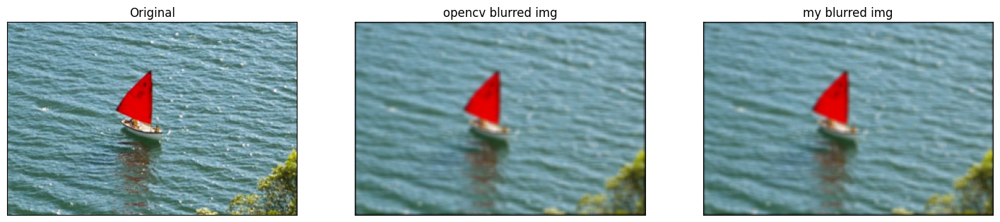

In [46]:
blur = cv2.blur(boat_img_rgb_cropped,(5,5),borderType=cv2.BORDER_CONSTANT)
# Show the images
plt.figure(figsize=[18,15])
plt.subplot(131),plt.imshow(boat_img_rgb_cropped),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(132),plt.imshow(blur),plt.title('opencv blurred img')
plt.xticks([]), plt.yticks([])
plt.subplot(133),plt.imshow(average_blur(boat_img_rgb_cropped,5)),plt.title('my blurred img')
plt.xticks([]), plt.yticks([])
plt.show()

### Gaussian Blurring, Median Blurring, Bilateral Filtering
- `cv2.GaussianBlur()` uses a Gaussian kernel
- `cv2.medianBlur()` takes the median of all the pixels under the kernel area and the central element is replaced with this median value. This is highly effective against salt-and-pepper noise in an image
- `cv2.bilateralFilter()` is highly effective in noise removal while keeping edges sharp. But the operation is slower compared to other filters

In this demo, we apply these filters on the image with salt-and-pepper noise.

In [47]:
def sp_noise(image,prob):
    '''
    Add salt and pepper noise to image
    prob: Probability of the noise
    '''
    output = np.zeros(image.shape,np.uint8)
    thres = 1 - prob
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            rdn = random.random()
            if rdn < prob:
                output[i][j] = 0
            elif rdn > thres:
                output[i][j] = 255
            else:
                output[i][j] = image[i][j]
    return output

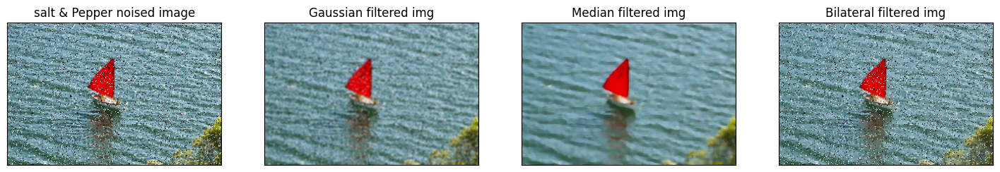

In [48]:
boat_img_rgb_cropped_noisy = sp_noise(boat_img_rgb_cropped,0.05)
blur_gaussian = cv2.GaussianBlur(boat_img_rgb_cropped_noisy,(5,5),0)
blur_median = cv2.medianBlur(boat_img_rgb_cropped_noisy,5)
blur_bilateral = cv2.bilateralFilter(boat_img_rgb_cropped_noisy,9,75,75)
# Show the images
plt.figure(figsize=[18,15])
plt.subplot(141),plt.imshow(boat_img_rgb_cropped_noisy),plt.title('salt & Pepper noised image')
plt.xticks([]), plt.yticks([])
plt.subplot(142),plt.imshow(blur_gaussian),plt.title('Gaussian filtered img')
plt.xticks([]), plt.yticks([])
plt.subplot(143),plt.imshow(blur_median),plt.title('Median filtered img')
plt.xticks([]), plt.yticks([])
plt.subplot(144),plt.imshow(blur_bilateral),plt.title('Bilateral filtered img')
plt.xticks([]), plt.yticks([])
plt.show()

# Image Histogram
Image Histogram gives you an overall idea about the intensity distribution of an image. It is a plot with pixel values in X-axis and corresponding number of pixels in the image on Y-axis.

It is just another way of understanding the image. By looking at the histogram of an image, you get intuition about contrast, brightness, intensity distribution etc of that image. Almost all image processing tools today, provides features on histogram

So now we use cv.calcHist() function to find the histogram. Let's familiarize with the function and its parameters :

 <font style="color:rgb(8,133,37)">**Function Syntax** </font>
 ``` python
hist = cv.calcHist(images, channels, mask, histSize, ranges[, hist[, accumulate]])
```
`hist`: 	Output histogram

**Parameters**:

1. `images` : source image of type uint8 or float32. it should be given in as a list, ie, [gray_img].
2. `channels` : it is also given in as a list []. It the index of channel for which we calculate histogram. For example, if input is grayscale image, its value is [0]. For color image, you can pass [0],[1] or [2] to calculate histogram of blue,green or red channel, respectively.
3. `mask` : Optional mask image. To find histogram of full image, it is set as None. However, if we want to get histogram of specific region of image, we should create a mask image for that and give it as mask.
4. `histSize` : this represents our BIN count. Need to be given in []. For full scale, we pass [256].
5. `ranges` : Normally, it is [0,256].

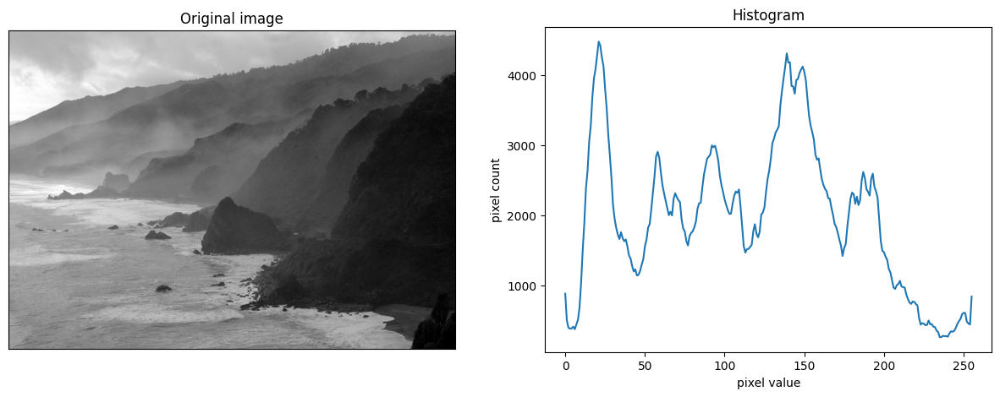

In [49]:
img_gray = cv2.imread("img/New_Zealand_Coast.jpg",0)
img_hist = cv2.calcHist([img_gray],[0],None,[256],[0,256])
# show image
plt.figure(figsize=[15,5])
plt.subplot(121),plt.imshow(img_gray,cmap='gray'),plt.title('Original image')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.plot(img_hist),plt.title('Histogram'),plt.xlabel('pixel value'),plt.ylabel('pixel count')
plt.show()

Your turn: calculate histogram of each channel of a color image using `cv2.calcHist`

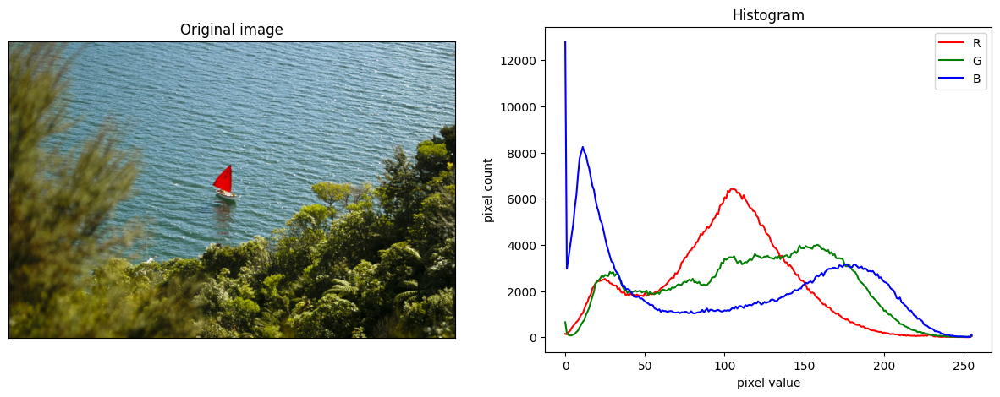

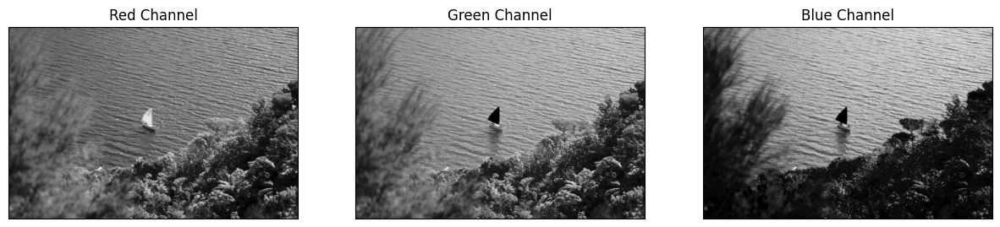

In [50]:
# Read in image using opencv
boat_img = cv2.imread("img/New_Zealand_Boat.jpg")
hist_r = None
hist_g = None
hist_b = None

##############################################################################
# TODO: calculate histogram of each channel using cv2.calcHist               #
##############################################################################
# Replace "pass" statement with your code
histr = cv2.calcHist([boat_img],[2],None,[256],[0,256])
histg = cv2.calcHist([boat_img],[1],None,[256],[0,256])
histb = cv2.calcHist([boat_img],[0],None,[256],[0,256])
# END OF YOUR CODE

# show image
plt.figure(figsize=[15,5])
plt.subplot(121),plt.imshow(boat_img[:,:,::-1]),plt.title('Original image')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.plot(histr,color='r',label='R'),plt.plot(histg,color='g',label='G'),plt.plot(histb,color='b',label='B')
plt.title('Histogram'),plt.xlabel('pixel value'),plt.ylabel('pixel count'), plt.legend()
plt.show()
plt.figure(figsize=[15,5])
plt.subplot(131);plt.imshow(boat_img[:,:,2],cmap='gray');plt.title("Red Channel");plt.xticks([]), plt.yticks([])
plt.subplot(132);plt.imshow(boat_img[:,:,1],cmap='gray');plt.title("Green Channel");plt.xticks([]), plt.yticks([])
plt.subplot(133);plt.imshow(boat_img[:,:,0],cmap='gray');plt.title("Blue Channel");plt.xticks([]), plt.yticks([])
plt.show()

In [51]:
assert histr.shape[0]==256
assert histg.shape[0]==256
assert histb.shape[0]==256